In [1]:
import tensorflow as tf
import numpy as np
from util import *
import os
import matplotlib.pyplot as plt
from tensorflow.python.ops import control_flow_ops
from losses import *
from flags_and_variables import *
from encode_boxes import *
from fcos import *
from tqdm import tqdm
from map import *

In [2]:
pyramid_dict = get_fpn_output(inputs,is_training=False,is_trainable=False,backbone='resnet_v2_50')
centerness_output,classes_output,boxes_output = get_network_output(feature_layer_list,pyramid_dict,feature_size,is_training=False)
centerness_output = tf.concat(centerness_output,axis=1)
classes_output = tf.concat(classes_output,axis=1)
boxes_output = tf.concat(boxes_output,axis=1)

###testing part
centerness_pred = tf.sigmoid(centerness_output)
classes_pred = tf.sigmoid(classes_output)
localization_pred = boxes_output

W1226 14:20:28.128875 139931833779968 lazy_loader.py:50] 
The TensorFlow contrib module will not be included in TensorFlow 2.0.
For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
  * https://github.com/tensorflow/io (for I/O related ops)
If you depend on functionality not listed there, please file an issue.

W1226 14:20:28.132162 139931833779968 deprecation.py:323] From /opt/anaconda3/lib/python3.7/site-packages/tensorflow_core/contrib/layers/python/layers/layers.py:1057: Layer.apply (from tensorflow.python.keras.engine.base_layer) is deprecated and will be removed in a future version.
Instructions for updating:
Please use `layer.__call__` method instead.
W1226 14:20:29.054527 139931833779968 deprecation.py:323] From /home/xinje/Desktop/FCOS_Billy/fcos.py:29: conv2d (from tensorflow.python.layers.convolutional) is deprecated and will be removed in a future version.
Instructio

In [3]:
 scores,classes,boxes = predict_outputs(centerness_pred,classes_pred,localization_pred,feature_size)

W1226 14:20:30.095603 139931833779968 deprecation.py:323] From /opt/anaconda3/lib/python3.7/site-packages/tensorflow_core/python/ops/array_ops.py:1475: where (from tensorflow.python.ops.array_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Instructions for updating:
Use standard file APIs to check for files with this prefix.
INFO:tensorflow:Restoring parameters from /media/xinje/New Volume/fcos/resnet_v2_50_freeze_bn/FCOS-resnet_v2_50-200
Restore from the checkpoint /media/xinje/New Volume/fcos/resnet_v2_50_freeze_bn/FCOS-resnet_v2_50-200


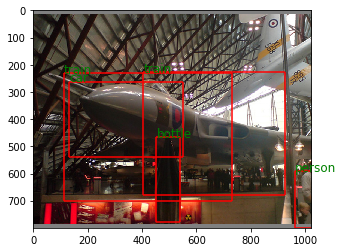

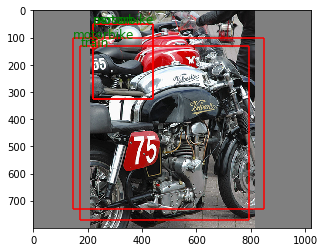

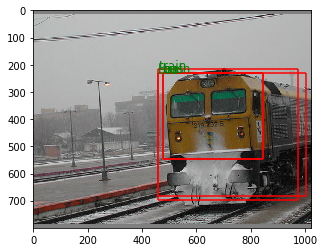

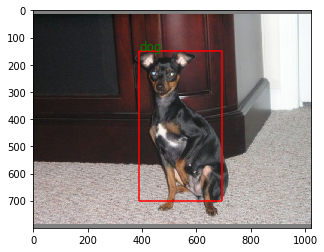

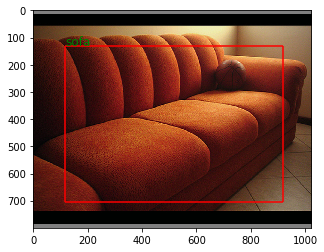

...

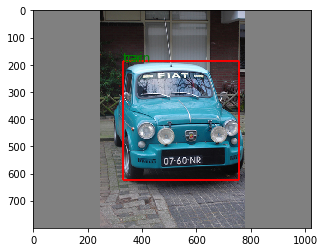

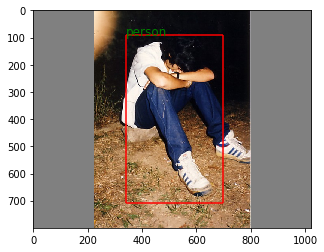

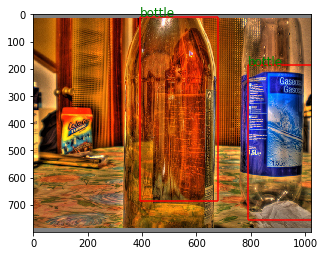

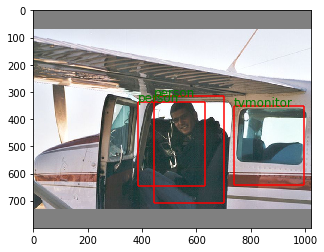

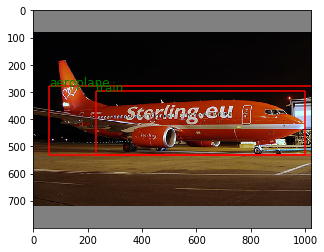

In [4]:
#inference
annotation_2012_test = get_path_and_annotation(FLAGS.test_2012_dir)
annotation_2007_test = get_path_and_annotation(FLAGS.test_2007_dir)
annotation = annotation_2012_test +annotation_2007_test
test_iter = read_data(annotation,1,input_shape=(FLAGS.image_height,FLAGS.image_width),is_random=False,is_crop=False)
with tf.Session() as sess:
    train_writer = tf.summary.FileWriter(FLAGS.log_dir,sess.graph)
    var_list = [var for var in tf.global_variables() if ("Adam" and 'AccumGrad') not in var.name]
    saver = tf.train.Saver(var_list=var_list, max_to_keep=10)
    sess.run(tf.global_variables_initializer())
    ckpt = tf.train.latest_checkpoint(FLAGS.checkpoint_dir)
    if ckpt:
        saver.restore(sess,ckpt)
        print('Restore from the checkpoint {0}'.format(ckpt))
    else:
        print('No checkpoints found')
        
    for j in range(100):
        image_batch,annotation_batch,cls_batch = next(test_iter)
        draw_1 = image_batch[0]*255
        [temp_scores_pred_list,temp_classes_pred_list,temp_localization_pred_list] = sess.run([scores,classes,boxes],feed_dict={inputs:image_batch})
        ymin,xmin,ymax,xmax=np.split(temp_localization_pred_list,axis=1,indices_or_sections =4)
        ymax[ymax>FLAGS.image_height]=FLAGS.image_height
        xmax[xmax>FLAGS.image_width]=FLAGS.image_width
        ymin[ymin<0]=0
        xmin[xmin<0]=0
        plt.hlines(ymin,xmin,xmax,'r')
        plt.hlines(ymax,xmin,xmax,'r')
        plt.vlines(xmin,ymin,ymax,'r')
        plt.vlines(xmax,ymin,ymax,'r')
        for i in range(temp_classes_pred_list.shape[0]):
            position = ((ymin[i]),(xmin[i]))
            plt.text(position[1],position[0],corresponding_dict[temp_classes_pred_list[i]],color='g',size = 12)
#             draw_1=cv2.rectangle(draw_1, (xmin[i],ymin[i]), (xmax[i],ymax[i]), (0,0,255), 2)
#             cv2.putText(draw_1, corresponding_dict[temp_classes_pred_list[i]], (xmin[i],ymin[i]), cv2.FONT_HERSHEY_COMPLEX, 0.7, (0,255,0), 3)
        plt.imshow(image_batch[0])
#         cv2.imwrite(str(j)+'.jpg',image_batch[0][:,:,::-1]*255)
        
#         cv2.imwrite(str(j)+'_revised.jpg',draw_1[:,:,::-1])
        plt.show()

In [4]:
#calculate MAP for the whole test set
annotation_2012_test = get_path_and_annotation(FLAGS.test_2012_dir)
annotation_2007_test = get_path_and_annotation(FLAGS.test_2007_dir)
annotation = annotation_2007_test+annotation_2012_test
test_iter = read_data(annotation,1,input_shape=(FLAGS.image_height,FLAGS.image_width),is_random=False,is_crop=False)

with tf.Session() as sess:
    train_writer = tf.summary.FileWriter(FLAGS.log_dir,sess.graph)
    var_list = [var for var in tf.global_variables() if ("Adam" and 'AccumGrad') not in var.name]
    saver = tf.train.Saver(var_list=var_list, max_to_keep=10)
    sess.run(tf.global_variables_initializer())
    ckpt = tf.train.latest_checkpoint(FLAGS.checkpoint_dir)
    if ckpt:
        saver.restore(sess,ckpt)
        print('Restore from the checkpoint {0}'.format(ckpt))
    else:
        print('No checkpoints found')
        
    pred_content = []
    gt_dict = {}
    for j in tqdm(range(len(annotation))):
        image_batch,annotation_batch,cls_batch = next(test_iter)
        image_path = annotation[j].split(' ')[0]+' '+annotation[j].split(' ')[1]
        #filter padding and add gt_data to gt_dict
        mask = (cls_batch-1)>=0
        cls_batch = (cls_batch[mask]-1).astype(np.int32)
        annotation_batch = annotation_batch[mask]*np.array([FLAGS.image_height,FLAGS.image_width,FLAGS.image_height,FLAGS.image_width])
        gt_dict[image_path] = np.concatenate([annotation_batch,np.expand_dims(cls_batch,axis=-1)],axis=-1)
        #calculate pred_content
        [temp_scores_pred_list,temp_classes_pred_list,temp_localization_pred_list] = sess.run([scores,classes,boxes],feed_dict={inputs:image_batch})             
        for k in range(temp_classes_pred_list.shape[0]):
            temp_y_min, temp_x_min, temp_y_max, temp_x_max = temp_localization_pred_list[k]
            score = temp_scores_pred_list[k]
            label = temp_classes_pred_list[k]
            pred_content.append([image_path, temp_y_min, temp_x_min, temp_y_max, temp_x_max, score, label])
            
#calculate AP for each class            
ap_list = []
recall_list = []
precision_list =[]
for i in range(FLAGS.num_class):
    ap,recall,precision = voc_eval(gt_dict, pred_content, i, iou_thres=0.5, use_07_metric=True)
    ap_list.append(ap)
    recall_list.append(recall)
    precision_list.append(precision)
print('MAP:')
print(np.array(ap_list).mean())
print('AP:')
print(ap_list)

  0%|          | 0/10775 [00:00<?, ?it/s]

Restore from the checkpoint /media/xinje/New Volume/fcos/resnet_v2_50_freeze_bn/FCOS-resnet_v2_50-1800


100%|██████████| 10775/10775 [17:36<00:00, 10.13it/s]


MAP:
0.5948887035606056
AP:
[0.6852500498657608, 0.633969512531199, 0.6291679958109323, 0.43688840811329316, 0.40920288073438177, 0.6716509931874379, 0.6648413977573991, 0.4327773975004297, 0.5525790953392301, 0.7763516675198332, 0.6327854780622097, 0.632980790777011, 0.3768077262956166, 0.6096534015678506, 0.4939914301512185, 0.6919351420140466, 0.6641755031383337, 0.8251771160452641, 0.7065192956606495, 0.37106878914001656]


In [5]:
np.array(ap_list).mean()

0.5936731223896724

In [1]:
ap_list = [0.6885923872834177,
 0.6375713223166245,
 0.6395657514477413,
 0.4248951118010394,
 0.40292599496692616,
 0.6652004261513632,
 0.6630718921375127,
 0.43493568193625204,
 0.5398263844136918,
 0.7705794857525695,
 0.6461363072777048,
 0.637930623652629,
 0.36914941964240955,
 0.6141838454473223,
 0.4930769583379746,
 0.692104751403251,
 0.6633393816393832,
 0.8229972399544155,
 0.7087739791439108,
 0.35860550308730776]